# Initial set up and preprocessing of data

In [1]:
import pandas as pd
import seaborn as sns
from scipy.stats import chi2_contingency
from scipy.stats import pointbiserialr
from statsmodels.graphics.mosaicplot import mosaic
import scipy.stats as ss
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.cm as cm
import matplotlib as mpl
from matplotlib.gridspec import GridSpec
import plotly.express as px
import plotly.io as pio

In [2]:
media_data = pd.read_excel("./data/DACC_Hackathon_Media_Habit_Survey.xlsx", sheet_name='Raw Responses')
panelist_data = pd.read_csv("panelists_demog_with_simulations.csv")

In [3]:
media_data

,ID,v_16,v_17,v_18,v_19,v_20,v_21,v_22,v_23,v_24,...,v_304,v_305,v_306,v_307,v_308,v_309,v_310,v_311,v_312,v_333
0,426187101,1,3.0,4.0,1.0,3.0,4.0,1.0,1.0,1.0,...,0,0,0,0,0,0,0,0,NaN,1.0
1,203116101,1,3.0,3.0,1.0,2.0,2.0,2.0,3.0,3.0,...,0,0,0,0,0,0,1,0,NaN,0.0
2,248111101,1,7.0,7.0,1.0,2.0,2.0,2.0,2.0,3.0,...,0,1,0,1,0,0,1,0,NaN,0.0
3,201019101,1,7.0,7.0,4.0,4.0,4.0,4.0,3.0,3.0,...,0,0,0,0,0,0,1,0,NaN,0.0
4,246226102,3,3.0,3.0,1.0,1.0,1.0,1.0,3.0,3.0,...,0,0,0,0,0,0,1,0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1886,802186201,1,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,...,0,0,0,0,0,0,1,0,NaN,0.0
1887,802188101,1,7.0,5.0,2.0,4.0,2.0,4.0,4.0,2.0,...,0,0,0,0,0,0,0,0,NaN,1.0
1888,802188801,1,8.0,8.0,3.0,3.0,3.0,3.0,3.0,3.0,...,0,0,0,0,0,0,1,0,NaN,0.0
1889,802189701,2,6.0,7.0,3.0,3.0,3.0,3.0,3.0,4.0,...,0,1,0,0,0,1,1,0,NaN,0.0


In [4]:
panelist_data

,ID,BMI,Ethnicity,Strata,Location,Lifestage,#HH,Income,Gender,Age_Category,Age,Weight,Height,BMI_Value,Physical_Level,BMR
0,101011101,Obese,Malay,Urban,North,Empty Nesters,1-3 Member HH,<RM2000 (Low),M,Empty Nesters,63,100.756250,175.0,32.9,Low,2283.439200
1,101016101,Healthy,Malay,Urban,North,Yankys/Matured Families,1-3 Member HH,<RM2000 (Low),M,Yankys,35,67.491380,183.7,20.0,High,2894.217918
2,101019101,Obese,Malay,Urban,North,Teens Aches,4-5 Member HH,<RM2000 (Low),F,Teens Aches,19,76.524346,154.4,32.1,Low,1912.317980
3,101024101,Over Weight,Chinese,Urban,North,Nesting Families,1-3 Member HH,<RM2000 (Low),M,Toddlers,3,84.708650,180.5,26.0,High,3648.146479
4,105009103,Over Weight,Malay,Rural,North,Empty Nesters,1-3 Member HH,<RM2000 (Low),M,Empty Nesters,49,85.008555,178.1,26.8,High,3098.543349
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3913,802312801,Not Available,Malay,Urban,Central,Nesting Families,4-5 Member HH,RM5000-RM7999 (Mid High),M,Toddlers,2,68.457250,167.5,24.4,Average,2841.094603
3914,802313601,Not Available,Malay,Urban,Central,Teens and Toddlers,6+ Member HH,RM3000-RM4999 (Mid Low),M,Teens Aches,14,78.792700,179.7,24.4,Low,2346.187976
3915,802314001,Not Available,Malay,Urban,North,Teens and Toddlers,6+ Member HH,RM5000-RM7999 (Mid High),F,Teens Aches,13,62.385944,159.9,24.4,High,2581.676031
3916,802315101,Not Available,Malay,Urban,Central,Teens Aches,4-5 Member HH,RM5000-RM7999 (Mid High),M,Teens Aches,13,83.148270,184.6,24.4,Low,2455.630801


In [5]:
media_data.dtypes

ID         int64
v_16       int64
v_17     float64
v_18     float64
v_19     float64
          ...   
v_309      int64
v_310      int64
v_311      int64
v_312     object
v_333    float64
Length: 261, dtype: object

In [6]:
non_number_df = media_data.select_dtypes(exclude=['int64', 'float64'])

In [7]:
non_number_cols = [col for col in non_number_df.columns]

In [8]:
non_number_cols

['v_55',
 'v_109',
 'v_125',
 'v_134',
 'v_136',
 'v_144',
 'v_152',
 'v_775',
 'v_312']

In [9]:
media_data = media_data.astype({'ID': 'string'})

In [10]:
# drop the non number cols as they are input answers from panelists, which are outliers and insignificant in the bigger picture
media_data = media_data.drop(columns=non_number_cols)

In [11]:
media_data = media_data.fillna(999) # empty values replaced with 999

# Creating a dictionary with keys being the question number and value being a dictionary of choices and the frequency of that choice


In [12]:
interview_question_ans_freq = {}

In [13]:
media_data.iloc[:, 1:]

,v_16,v_17,v_18,v_19,v_20,v_21,v_22,v_23,v_24,v_25,...,v_780,v_304,v_305,v_306,v_307,v_308,v_309,v_310,v_311,v_333
0,1,3.0,4.0,1.0,3.0,4.0,1.0,1.0,1.0,1.0,...,1.0,0,0,0,0,0,0,0,0,1.0
1,1,3.0,3.0,1.0,2.0,2.0,2.0,3.0,3.0,4.0,...,0.0,0,0,0,0,0,0,1,0,0.0
2,1,7.0,7.0,1.0,2.0,2.0,2.0,2.0,3.0,4.0,...,0.0,0,1,0,1,0,0,1,0,0.0
3,1,7.0,7.0,4.0,4.0,4.0,4.0,3.0,3.0,4.0,...,0.0,0,0,0,0,0,0,1,0,0.0
4,3,3.0,3.0,1.0,1.0,1.0,1.0,3.0,3.0,3.0,...,999.0,0,0,0,0,0,0,1,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1886,1,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,4.0,...,0.0,0,0,0,0,0,0,1,0,0.0
1887,1,7.0,5.0,2.0,4.0,2.0,4.0,4.0,2.0,4.0,...,0.0,0,0,0,0,0,0,0,0,1.0
1888,1,8.0,8.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,...,999.0,0,0,0,0,0,0,1,0,0.0
1889,2,6.0,7.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,...,1.0,0,1,0,0,0,1,1,0,0.0


In [14]:
for question in media_data.iloc[:, 1:]:
    if question not in interview_question_ans_freq.keys():
        interview_question_ans_freq[question] = {}
    for answer in media_data[question]:
        if answer not in interview_question_ans_freq[question].keys():
            interview_question_ans_freq[question][answer] = 0
        interview_question_ans_freq[question][answer] += 1

In [15]:
interview_question_ans_freq

{'v_16': {1: 1320, 3: 140, 7: 65, 6: 110, 2: 120, 4: 81, 5: 55},
 'v_17': {3.0: 224,
  7.0: 149,
  6.0: 243,
  5.0: 345,
  999.0: 65,
  8.0: 106,
  4.0: 214,
  10.0: 63,
  9.0: 52,
  2.0: 249,
  11.0: 57,
  1.0: 107,
  12.0: 17},
 'v_18': {4.0: 152,
  3.0: 202,
  7.0: 179,
  6.0: 269,
  9.0: 78,
  999.0: 65,
  8.0: 155,
  10.0: 85,
  5.0: 318,
  11.0: 82,
  2.0: 187,
  1.0: 98,
  12.0: 21},
 'v_19': {1.0: 809, 4.0: 243, 999.0: 82, 3.0: 588, 2.0: 169},
 'v_20': {3.0: 711, 2.0: 191, 4.0: 227, 1.0: 680, 999.0: 82},
 'v_21': {4.0: 334, 2.0: 175, 1.0: 596, 999.0: 82, 3.0: 704},
 'v_22': {1.0: 554, 2.0: 162, 4.0: 376, 3.0: 717, 999.0: 82},
 'v_23': {1.0: 507, 3.0: 762, 2.0: 160, 4.0: 380, 999.0: 82},
 'v_24': {1.0: 398, 3.0: 713, 4.0: 552, 999.0: 82, 2.0: 146},
 'v_25': {1.0: 155, 4.0: 1015, 3.0: 557, 999.0: 82, 2.0: 82},
 'v_26': {4.0: 783, 3.0: 645, 999.0: 82, 2.0: 105, 1.0: 276},
 'v_27': {4.0: 175, 2.0: 289, 1.0: 927, 3.0: 418, 999.0: 82},
 'v_28': {1.0: 1518, 999.0: 82, 3.0: 112, 2.0: 1

# Manually picking the relevant questions for the project


In [16]:
# relevant questions are handpicked after manually reading through the dataset provided, but not all will be used for visualisation
RELEVANT_QUESTIONS = {
    'Watch_TV_frequency': ['v_' + str(i) for i in range(16, 55)], 
    'TV_channels': ['v_62', 'v_63', 'v_64', 'v_65', 'v_66', 'v_67', 'v_68', 'v_70', 
                    'v_71', 'v_72', 'v_73', 'v_74', 'v_76', 'v_77', 'v_78', 'v_79', 
                    'v_80', 'v_82', 'v_83', 'v_84', 'v_85', 'v_86', 'v_88', 'v_89', 
                    'v_90', 'v_92', 'v_93', 'v_94', 'v_96', 'v_97', 'v_98', 'v_100', 
                    'v_101', 'v_102', 'v_104', 'v_105', 'v_106', 'v_108'], 
    'Internet_usage': ['v_' + str(i) for i in range(140, 144)], 
    'Device_for_internet': ['v_' + str(i) for i in range(147, 151)], 
    'Type_of_websites_visited': ['v_' + str(i) for i in range(318, 333)], 
    'Specific_websites_visited': ['v_' + str(i) for i in range(158, 184)], 
    'Own_phones_and_type_of_phones': ['v_' + str(i) for i in range(210, 213)], 
    'Radio_frequency': ['v_' + str(i) for i in range(232, 234)] + ['dupl1_v_' + str(i) for i in range(175, 184)] + ['v_184'] + ['v_598'] + ['v_' + str(i) for i in range(190, 209)] + ['v_599'] + 
                        ['dupl1_v_209'] + ['v_600'],
    'Which_radio_station_and_frequency': ['dupl1_v_' + str(i) for i in range(210, 213)] + ['v_' + str(i) for i in range(213, 216)]
                                          + ['dupl1_v_216'] + ['v_' + str(i) for i in range(761, 766)] + ['v_767', 'v_768'] + ['v_' + str(i) for i in range(770, 775)], 
    'Newspaper_frequency_and_content_read': ['dupl1_v_' + str(i) for i in range(222, 224)] + ['v_1154'] + ['dupl1_v_229'] + ['v_' + str(i) for i in range(777, 781)]
}

# Merging 2 dataframes

In [17]:
panelist_data = panelist_data.astype({'ID': 'string'})

## Filtering out the surveyed panelists

In [18]:
panelist_data

,ID,BMI,Ethnicity,Strata,Location,Lifestage,#HH,Income,Gender,Age_Category,Age,Weight,Height,BMI_Value,Physical_Level,BMR
0,101011101,Obese,Malay,Urban,North,Empty Nesters,1-3 Member HH,<RM2000 (Low),M,Empty Nesters,63,100.756250,175.0,32.9,Low,2283.439200
1,101016101,Healthy,Malay,Urban,North,Yankys/Matured Families,1-3 Member HH,<RM2000 (Low),M,Yankys,35,67.491380,183.7,20.0,High,2894.217918
2,101019101,Obese,Malay,Urban,North,Teens Aches,4-5 Member HH,<RM2000 (Low),F,Teens Aches,19,76.524346,154.4,32.1,Low,1912.317980
3,101024101,Over Weight,Chinese,Urban,North,Nesting Families,1-3 Member HH,<RM2000 (Low),M,Toddlers,3,84.708650,180.5,26.0,High,3648.146479
4,105009103,Over Weight,Malay,Rural,North,Empty Nesters,1-3 Member HH,<RM2000 (Low),M,Empty Nesters,49,85.008555,178.1,26.8,High,3098.543349
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3913,802312801,Not Available,Malay,Urban,Central,Nesting Families,4-5 Member HH,RM5000-RM7999 (Mid High),M,Toddlers,2,68.457250,167.5,24.4,Average,2841.094603
3914,802313601,Not Available,Malay,Urban,Central,Teens and Toddlers,6+ Member HH,RM3000-RM4999 (Mid Low),M,Teens Aches,14,78.792700,179.7,24.4,Low,2346.187976
3915,802314001,Not Available,Malay,Urban,North,Teens and Toddlers,6+ Member HH,RM5000-RM7999 (Mid High),F,Teens Aches,13,62.385944,159.9,24.4,High,2581.676031
3916,802315101,Not Available,Malay,Urban,Central,Teens Aches,4-5 Member HH,RM5000-RM7999 (Mid High),M,Teens Aches,13,83.148270,184.6,24.4,Low,2455.630801


In [19]:
media_data.shape

(1891, 252)

In [20]:
# checking if there are duplicate IDs
media_data.nunique(axis=0)['ID']

1891

In [21]:
surveyed_panelists = list(media_data['ID'])

In [22]:
surveyed_panelist_demog_data = panelist_data[panelist_data['ID'].isin(surveyed_panelists)] 

In [23]:
surveyed_panelist_demog_data # 1891 vs 1878, 13 panelists surveyed but not in the demog data

,ID,BMI,Ethnicity,Strata,Location,Lifestage,#HH,Income,Gender,Age_Category,Age,Weight,Height,BMI_Value,Physical_Level,BMR
0,101011101,Obese,Malay,Urban,North,Empty Nesters,1-3 Member HH,<RM2000 (Low),M,Empty Nesters,63,100.756250,175.0,32.9,Low,2283.439200
6,105017101,Obese,Malay,Rural,North,Yankys/Matured Families,1-3 Member HH,<RM2000 (Low),M,Empty Nesters,58,93.494974,165.1,34.3,Low,2144.635376
7,105021106,Obese,Malay,Rural,North,Yankys/Matured Families,4-5 Member HH,RM3000-RM4999 (Mid Low),M,Empty Nesters,52,85.450982,162.4,32.4,Low,2044.239261
11,105044101,Over Weight,Chinese,Rural,North,Yankys/Matured Families,4-5 Member HH,RM2000-RM2999 (Low High),M,Empty Nesters,57,92.598687,183.5,27.5,High,3232.086684
12,105046101,Healthy,Malay,Rural,North,Teens Aches,4-5 Member HH,<RM2000 (Low),M,Teens Aches,16,79.143864,180.1,24.4,Average,3020.143805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3690,802188101,Not Available,Malay,Urban,Central,Teens Aches,4-5 Member HH,RM5000-RM7999 (Mid High),M,Teens Aches,10,65.067212,163.3,24.4,Average,2652.460334
3691,802188801,Not Available,Malay,Urban,Central,Teens Aches,4-5 Member HH,RM3000-RM4999 (Mid Low),F,Teens Aches,14,61.530554,158.8,24.4,Average,2296.685660
3692,802188901,Not Available,Malay,Rural,South,Nesting Families,4-5 Member HH,RM5000-RM7999 (Mid High),M,Toddlers,2,76.011490,176.5,24.4,High,3418.842364
3695,802189701,Not Available,Malay,Urban,South,Yankys/Matured Families,1-3 Member HH,RM2000-RM2999 (Low High),M,Empty Nesters,54,81.802488,183.1,24.4,Average,2702.241388


In [24]:
# finding out which panelist not included
surveyed_panelists_not_in_demog_data = list(media_data[media_data['ID'].isin(list(surveyed_panelist_demog_data['ID'])) == False]['ID'])
print(surveyed_panelists_not_in_demog_data)

['802013601', '802025701', '801989501', '802015801', '801952201', '802003901', '801996101', '802023401', '801990401', '802031201', '802086901', '802172601', '802164201']


In [25]:
media_data_those_with_demog_data = media_data[media_data.ID.isin(surveyed_panelists_not_in_demog_data)==False] # drop those surveyed but no demog data

## Dropping irrelevant questions from the dataframe

In [26]:
relevant_questions = []
for questions_list in RELEVANT_QUESTIONS.values():
    for question in questions_list:
        relevant_questions.append(question)
print(relevant_questions)

['v_16', 'v_17', 'v_18', 'v_19', 'v_20', 'v_21', 'v_22', 'v_23', 'v_24', 'v_25', 'v_26', 'v_27', 'v_28', 'v_29', 'v_30', 'v_31', 'v_32', 'v_33', 'v_34', 'v_35', 'v_36', 'v_37', 'v_38', 'v_39', 'v_40', 'v_41', 'v_42', 'v_43', 'v_44', 'v_45', 'v_46', 'v_47', 'v_48', 'v_49', 'v_50', 'v_51', 'v_52', 'v_53', 'v_54', 'v_62', 'v_63', 'v_64', 'v_65', 'v_66', 'v_67', 'v_68', 'v_70', 'v_71', 'v_72', 'v_73', 'v_74', 'v_76', 'v_77', 'v_78', 'v_79', 'v_80', 'v_82', 'v_83', 'v_84', 'v_85', 'v_86', 'v_88', 'v_89', 'v_90', 'v_92', 'v_93', 'v_94', 'v_96', 'v_97', 'v_98', 'v_100', 'v_101', 'v_102', 'v_104', 'v_105', 'v_106', 'v_108', 'v_140', 'v_141', 'v_142', 'v_143', 'v_147', 'v_148', 'v_149', 'v_150', 'v_318', 'v_319', 'v_320', 'v_321', 'v_322', 'v_323', 'v_324', 'v_325', 'v_326', 'v_327', 'v_328', 'v_329', 'v_330', 'v_331', 'v_332', 'v_158', 'v_159', 'v_160', 'v_161', 'v_162', 'v_163', 'v_164', 'v_165', 'v_166', 'v_167', 'v_168', 'v_169', 'v_170', 'v_171', 'v_172', 'v_173', 'v_174', 'v_175', 'v_176'

In [27]:
all_questions_df = media_data_those_with_demog_data
all_questions_df

,ID,v_16,v_17,v_18,v_19,v_20,v_21,v_22,v_23,v_24,...,v_780,v_304,v_305,v_306,v_307,v_308,v_309,v_310,v_311,v_333
0,426187101,1,3.0,4.0,1.0,3.0,4.0,1.0,1.0,1.0,...,1.0,0,0,0,0,0,0,0,0,1.0
1,203116101,1,3.0,3.0,1.0,2.0,2.0,2.0,3.0,3.0,...,0.0,0,0,0,0,0,0,1,0,0.0
2,248111101,1,7.0,7.0,1.0,2.0,2.0,2.0,2.0,3.0,...,0.0,0,1,0,1,0,0,1,0,0.0
3,201019101,1,7.0,7.0,4.0,4.0,4.0,4.0,3.0,3.0,...,0.0,0,0,0,0,0,0,1,0,0.0
4,246226102,3,3.0,3.0,1.0,1.0,1.0,1.0,3.0,3.0,...,999.0,0,0,0,0,0,0,1,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1886,802186201,1,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,...,0.0,0,0,0,0,0,0,1,0,0.0
1887,802188101,1,7.0,5.0,2.0,4.0,2.0,4.0,4.0,2.0,...,0.0,0,0,0,0,0,0,0,0,1.0
1888,802188801,1,8.0,8.0,3.0,3.0,3.0,3.0,3.0,3.0,...,999.0,0,0,0,0,0,0,1,0,0.0
1889,802189701,2,6.0,7.0,3.0,3.0,3.0,3.0,3.0,4.0,...,1.0,0,1,0,0,0,1,1,0,0.0


In [28]:
relevant_ids = list(all_questions_df.ID)

In [29]:
len(relevant_questions)

191

In [30]:
df = all_questions_df.filter(items=relevant_questions)

In [31]:
df.insert(loc=0, column='ID', value=relevant_ids)

In [32]:
df

,ID,v_16,v_17,v_18,v_19,v_20,v_21,v_22,v_23,v_24,...,v_773,v_774,dupl1_v_222,dupl1_v_223,v_1154,dupl1_v_229,v_777,v_778,v_779,v_780
0,426187101,1,3.0,4.0,1.0,3.0,4.0,1.0,1.0,1.0,...,1.0,1.0,3,2.0,1.0,1.0,0.0,1.0,1.0,1.0
1,203116101,1,3.0,3.0,1.0,2.0,2.0,2.0,3.0,3.0,...,1.0,1.0,4,3.0,0.0,1.0,0.0,1.0,0.0,0.0
2,248111101,1,7.0,7.0,1.0,2.0,2.0,2.0,2.0,3.0,...,2.0,1.0,6,6.0,1.0,1.0,1.0,1.0,1.0,0.0
3,201019101,1,7.0,7.0,4.0,4.0,4.0,4.0,3.0,3.0,...,1.0,4.0,1,4.0,0.0,1.0,0.0,1.0,0.0,0.0
4,246226102,3,3.0,3.0,1.0,1.0,1.0,1.0,3.0,3.0,...,1.0,1.0,7,999.0,999.0,999.0,999.0,999.0,999.0,999.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1886,802186201,1,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,...,1.0,1.0,6,2.0,0.0,1.0,0.0,1.0,0.0,0.0
1887,802188101,1,7.0,5.0,2.0,4.0,2.0,4.0,4.0,2.0,...,1.0,1.0,5,4.0,1.0,1.0,0.0,1.0,1.0,0.0
1888,802188801,1,8.0,8.0,3.0,3.0,3.0,3.0,3.0,3.0,...,1.0,1.0,7,999.0,999.0,999.0,999.0,999.0,999.0,999.0
1889,802189701,2,6.0,7.0,3.0,3.0,3.0,3.0,3.0,4.0,...,1.0,1.0,5,3.0,1.0,1.0,1.0,1.0,1.0,1.0


In [33]:
surveyed_panelist_demog_and_media_data = pd.merge(surveyed_panelist_demog_data, df, how='outer', on='ID')

In [34]:
surveyed_panelist_demog_and_media_data

,ID,BMI,Ethnicity,Strata,Location,Lifestage,#HH,Income,Gender,Age_Category,...,v_773,v_774,dupl1_v_222,dupl1_v_223,v_1154,dupl1_v_229,v_777,v_778,v_779,v_780
0,101011101,Obese,Malay,Urban,North,Empty Nesters,1-3 Member HH,<RM2000 (Low),M,Empty Nesters,...,1.0,1.0,6,2.0,1.0,1.0,0.0,0.0,0.0,1.0
1,105017101,Obese,Malay,Rural,North,Yankys/Matured Families,1-3 Member HH,<RM2000 (Low),M,Empty Nesters,...,999.0,999.0,6,4.0,0.0,1.0,0.0,1.0,0.0,0.0
2,105021106,Obese,Malay,Rural,North,Yankys/Matured Families,4-5 Member HH,RM3000-RM4999 (Mid Low),M,Empty Nesters,...,1.0,4.0,1,3.0,1.0,1.0,1.0,0.0,0.0,0.0
3,105044101,Over Weight,Chinese,Rural,North,Yankys/Matured Families,4-5 Member HH,RM2000-RM2999 (Low High),M,Empty Nesters,...,4.0,1.0,7,999.0,999.0,999.0,999.0,999.0,999.0,999.0
4,105046101,Healthy,Malay,Rural,North,Teens Aches,4-5 Member HH,<RM2000 (Low),M,Teens Aches,...,1.0,1.0,1,3.0,1.0,1.0,1.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1873,802188101,Not Available,Malay,Urban,Central,Teens Aches,4-5 Member HH,RM5000-RM7999 (Mid High),M,Teens Aches,...,1.0,1.0,5,4.0,1.0,1.0,0.0,1.0,1.0,0.0
1874,802188801,Not Available,Malay,Urban,Central,Teens Aches,4-5 Member HH,RM3000-RM4999 (Mid Low),F,Teens Aches,...,1.0,1.0,7,999.0,999.0,999.0,999.0,999.0,999.0,999.0
1875,802188901,Not Available,Malay,Rural,South,Nesting Families,4-5 Member HH,RM5000-RM7999 (Mid High),M,Toddlers,...,3.0,1.0,6,1.0,0.0,1.0,0.0,0.0,0.0,0.0
1876,802189701,Not Available,Malay,Urban,South,Yankys/Matured Families,1-3 Member HH,RM2000-RM2999 (Low High),M,Empty Nesters,...,1.0,1.0,5,3.0,1.0,1.0,1.0,1.0,1.0,1.0


# Visualising Data

## By Age Group

### Yankys

In [35]:
surveyed_panelist_demog_and_media_data['Age_Category'].unique()

array(['Empty Nesters', 'Teens Aches', 'Toddlers', 'Yankys'], dtype=object)

In [36]:
# sorting data such that only yankys data are used
yankys_data = surveyed_panelist_demog_and_media_data[(surveyed_panelist_demog_and_media_data['Age_Category'] == 'Yankys')]
yankys_questions = yankys_data.iloc[:, 16:]
yankys_answer_counts_df_dict = {}
yankys_labels_dict = {}
yankys_counts_dict = {}
for ans in yankys_questions.columns:
    yankys_answer_counts_df_dict[ans] = yankys_data.groupby(ans).agg('count')
    yankys_labels_dict[ans] = yankys_data.groupby(ans).agg('count').ID.sort_values().index
    yankys_counts_dict[ans] = yankys_data.groupby(ans).agg('count').ID.sort_values()

In [37]:
len(yankys_questions.columns)

191

<ipython-input-38-3e51846ab987>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i, figsize=(20,10))


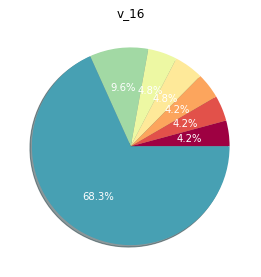

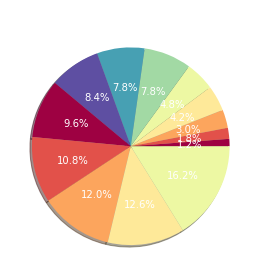

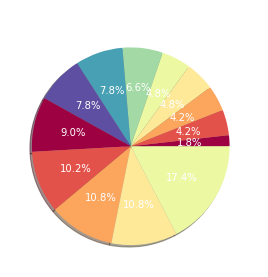

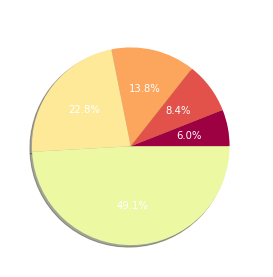

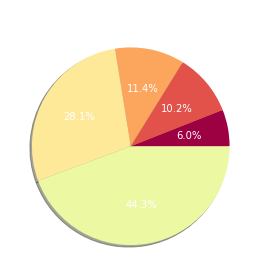

...

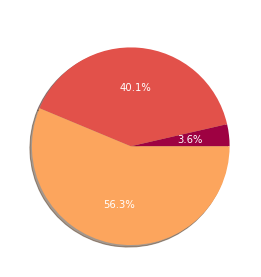

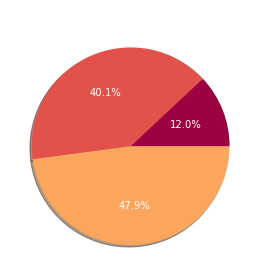

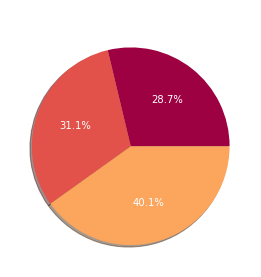

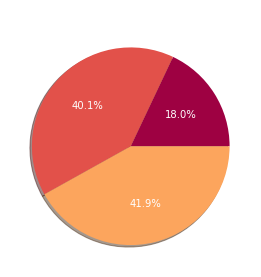

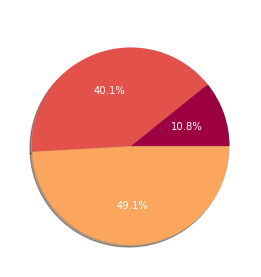

In [38]:
yankys_plots = {}
for i in range(len(yankys_questions.columns)):
    ans =  yankys_questions.columns[i]
    yankys_answer_counts_df = yankys_answer_counts_df_dict[ans]
    yankys_labels = yankys_labels_dict[ans]
    yankys_counts =  yankys_counts_dict[ans]

    plt.figure(i, figsize=(20,10)) 
    the_grid = GridSpec(2, 2)
    cmap = plt.get_cmap('Spectral')
    colors = [cmap(i) for i in np.linspace(0, 1, 8)]
    plt.subplot(the_grid[0, 1], aspect=1, title=ans)
    mpl.rcParams['text.color'] = 'w'
    plot = plt.pie(yankys_counts, labels=yankys_labels, autopct='%1.1f%%', shadow=True, colors=colors)

    yankys_plots[ans] = plot


### Toddlers

In [39]:
# sorting data such that only toddlers data are used
toddlers_data = surveyed_panelist_demog_and_media_data[(surveyed_panelist_demog_and_media_data['Age_Category'] == 'Toddlers')]
toddlers_questions = toddlers_data.iloc[:, 16:]
toddlers_answer_counts_df_dict = {}
toddlers_labels_dict = {}
toddlers_counts_dict = {}
for ans in toddlers_questions.columns:
    toddlers_answer_counts_df_dict[ans] = toddlers_data.groupby(ans).agg('count')
    toddlers_labels_dict[ans] = toddlers_data.groupby(ans).agg('count').ID.sort_values().index
    toddlers_counts_dict[ans] = toddlers_data.groupby(ans).agg('count').ID.sort_values()

In [40]:
len(toddlers_questions.columns)

191

<ipython-input-41-f537afbff013>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i, figsize=(20,10))


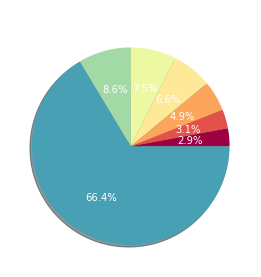

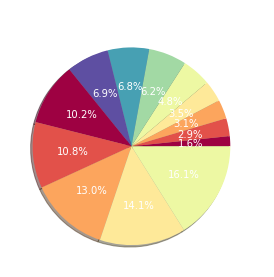

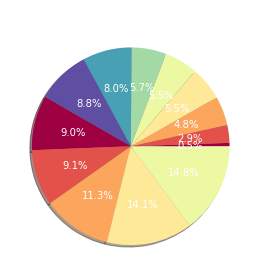

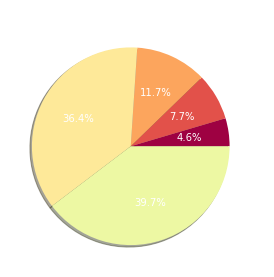

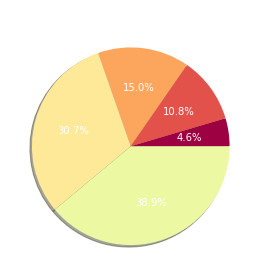

...

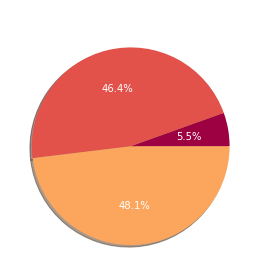

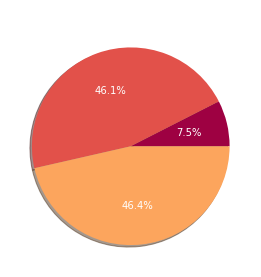

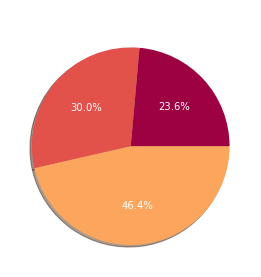

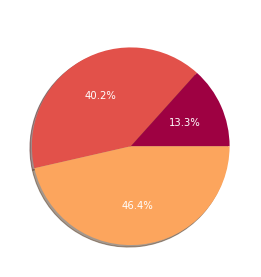

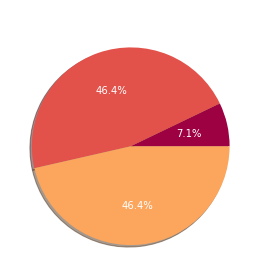

In [41]:
for i in range(len(toddlers_questions.columns)):
    ans =  toddlers_questions.columns[i]
    toddlers_answer_counts_df = toddlers_answer_counts_df_dict[ans]
    toddlers_labels = toddlers_labels_dict[ans]
    toddlers_counts =  toddlers_counts_dict[ans]

    plt.figure(i, figsize=(20,10)) 
    the_grid = GridSpec(2, 2)
    cmap = plt.get_cmap('Spectral')
    colors = [cmap(i) for i in np.linspace(0, 1, 8)]
    plt.subplot(the_grid[0, 1], aspect=1, title=ans)
    mpl.rcParams['text.color'] = 'w'
    plt.pie(toddlers_counts, labels=toddlers_labels, autopct='%1.1f%%', shadow=True, colors=colors)

### Empty Nesters

In [42]:
# sorting data such that only Empty Nesters data are used
empty_nesters_data = surveyed_panelist_demog_and_media_data[(surveyed_panelist_demog_and_media_data['Age_Category'] == 'Empty Nesters')]
empty_nesters_questions = empty_nesters_data.iloc[:, 16:]
empty_nesters_answer_counts_df_dict = {}
empty_nesters_labels_dict = {}
empty_nesters_counts_dict = {}
for ans in empty_nesters_questions.columns:
    empty_nesters_answer_counts_df_dict[ans] = empty_nesters_data.groupby(ans).agg('count')
    empty_nesters_labels_dict[ans] = empty_nesters_data.groupby(ans).agg('count').ID.sort_values().index
    empty_nesters_counts_dict[ans] = empty_nesters_data.groupby(ans).agg('count').ID.sort_values()

In [43]:
len(empty_nesters_questions.columns)

191

<ipython-input-44-37fa53f37233>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i, figsize=(20,10))


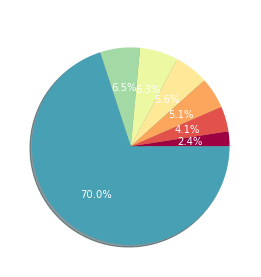

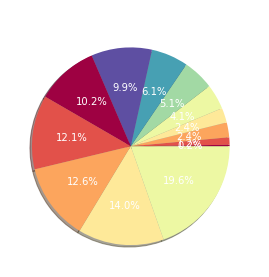

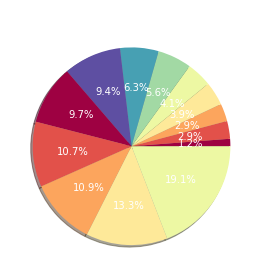

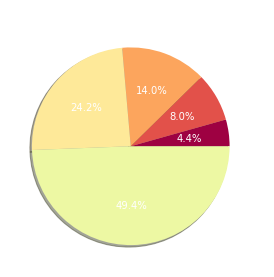

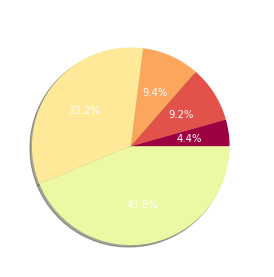

...

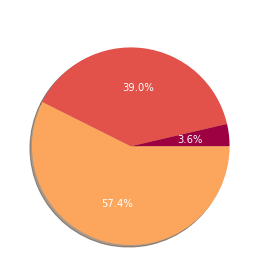

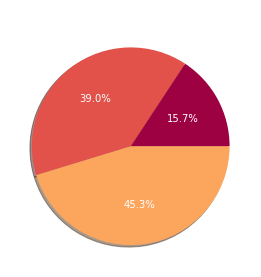

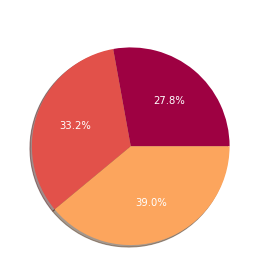

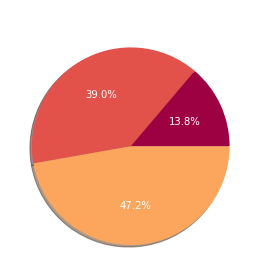

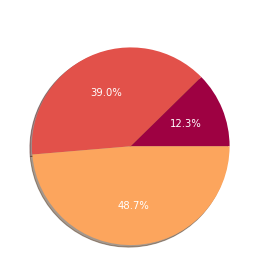

In [44]:
for i in range(len(empty_nesters_questions.columns)):
    ans =  empty_nesters_questions.columns[i]
    empty_nesters_answer_counts_df = empty_nesters_answer_counts_df_dict[ans]
    empty_nesters_labels = empty_nesters_labels_dict[ans]
    empty_nesters_counts =  empty_nesters_counts_dict[ans]

    plt.figure(i, figsize=(20,10)) 
    the_grid = GridSpec(2, 2)
    cmap = plt.get_cmap('Spectral')
    colors = [cmap(i) for i in np.linspace(0, 1, 8)]
    plt.subplot(the_grid[0, 1], aspect=1, title=ans)
    mpl.rcParams['text.color'] = 'w'
    plt.pie(empty_nesters_counts, labels=empty_nesters_labels, autopct='%1.1f%%', shadow=True, colors=colors)

### Teens Aches

In [45]:
# sorting data such that only teens aches data are used
teens_aches_data = surveyed_panelist_demog_and_media_data[(surveyed_panelist_demog_and_media_data['Age_Category'] == 'Teens Aches')]
teens_aches_questions = teens_aches_data.iloc[:, 16:]
teens_aches_answer_counts_df_dict = {}
teens_aches_labels_dict = {}
teens_aches_counts_dict = {}
for ans in teens_aches_questions.columns:
    teens_aches_answer_counts_df_dict[ans] = teens_aches_data.groupby(ans).agg('count')
    teens_aches_labels_dict[ans] = teens_aches_data.groupby(ans).agg('count').ID.sort_values().index
    teens_aches_counts_dict[ans] = teens_aches_data.groupby(ans).agg('count').ID.sort_values()

In [46]:
len(teens_aches_questions.columns)

191

<ipython-input-47-221a1f8ab3ce>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i, figsize=(20,10))


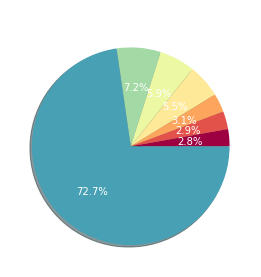

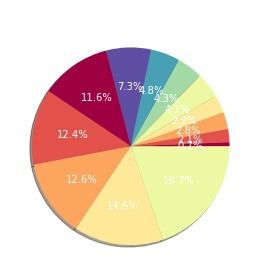

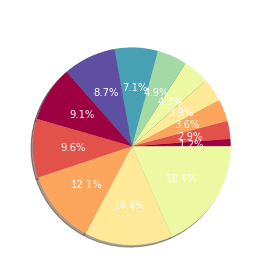

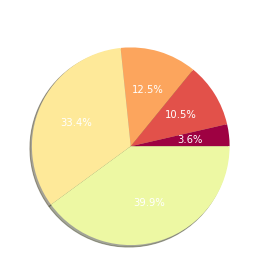

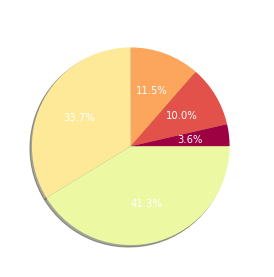

...

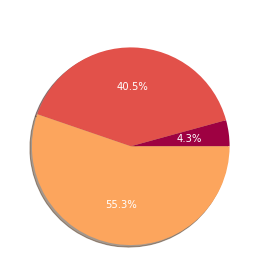

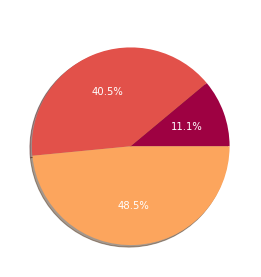

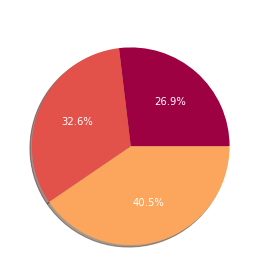

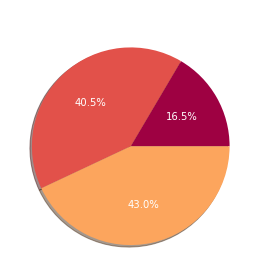

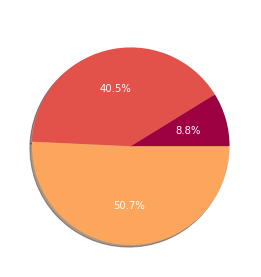

In [47]:
for i in range(len(teens_aches_questions.columns)):
    ans =  teens_aches_questions.columns[i]
    teens_aches_answer_counts_df = teens_aches_answer_counts_df_dict[ans]
    teens_aches_labels = teens_aches_labels_dict[ans]
    teens_aches_counts =  teens_aches_counts_dict[ans]

    plt.figure(i, figsize=(20,10)) 
    the_grid = GridSpec(2, 2)
    cmap = plt.get_cmap('Spectral')
    colors = [cmap(i) for i in np.linspace(0, 1, 8)]
    plt.subplot(the_grid[0, 1], aspect=1, title=ans)
    mpl.rcParams['text.color'] = 'w'
    plt.pie(teens_aches_counts, labels=teens_aches_labels, autopct='%1.1f%%', shadow=True, colors=colors)

## Comparing data across age groups

In [48]:
dupl1_v_222 = ['dupl1_v_222']

In [49]:
for i in range(len(dupl1_v_222)):
    axis_label = ''
    ans = dupl1_v_222[i]
    to_plot = surveyed_panelist_demog_and_media_data[['Age_Category', ans]]
    to_plot = to_plot[to_plot[ans] != 999]
    plot = px.box(to_plot, x='Age_Category', y=ans,
                    labels={
                        'Age_Category': 'Age Group', 
                        ans : axis_label
                    })
    plot.update_layout(title_text='In the last 3 months, how frequently do you read Newspapers – (can be daily or weekly or fortnightly newspaper) either at home or somewhere else?', title_x=0.5,
        yaxis = dict(
            tickmode = 'array',
            tickvals = [1, 2, 3, 4, 5, 6, 7],#, 5, 6, 7, 8, 9, 10, 11, 12],
            ticktext = ['Daily', '5-6 days a week', '3-4 days a week', '1-2 days a week', 'A few times per month', 'Less often', 'Never'],
        ), 
    )
    plot.show()
